## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [2]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
#%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

## Calibrate camera, calculate distortion coefficients, and test undistorted image

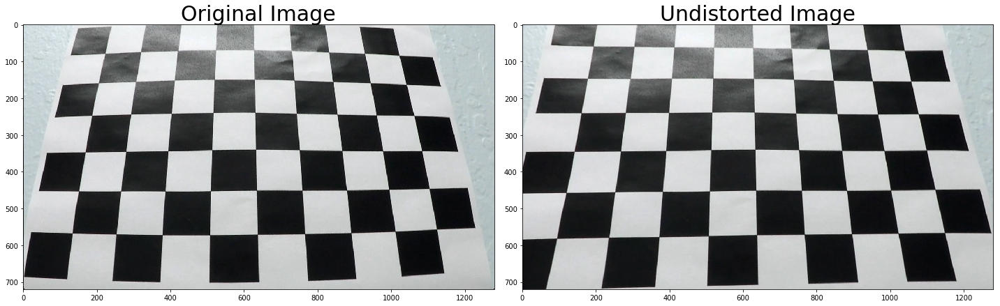

In [23]:
import pickle
import matplotlib.image as mimg
%matplotlib inline

# Test undistortion on a random image
img = cv2.imread(images[1])
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('../camera_cal/test_undist.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "../camera_cal/wide_dist_pickle.p", "wb" ) )
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)
plt.tight_layout()
f.savefig("undistort_output.png")

## Now, apply thresholding to find lanes

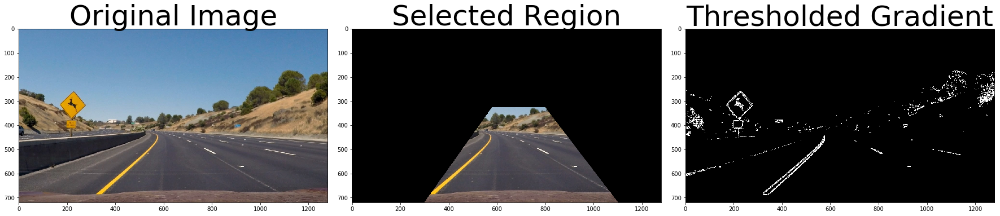

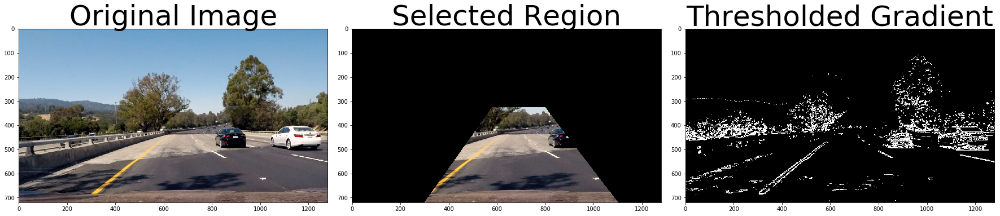

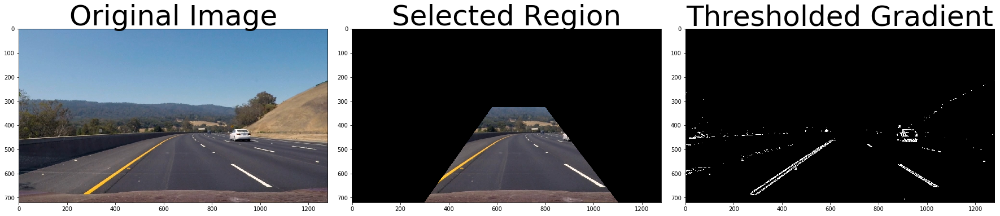

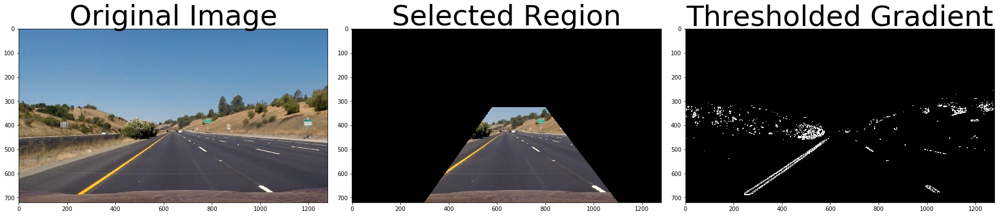

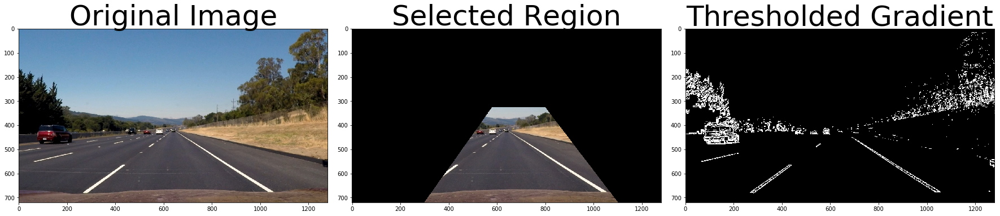

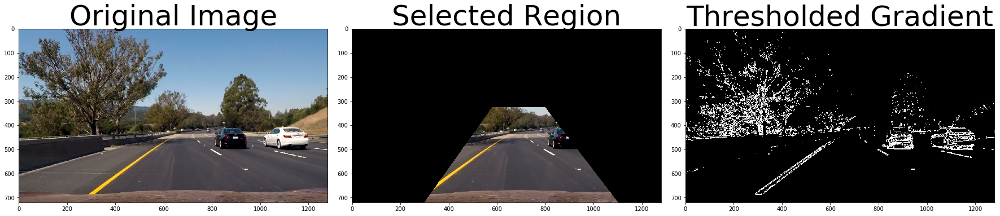

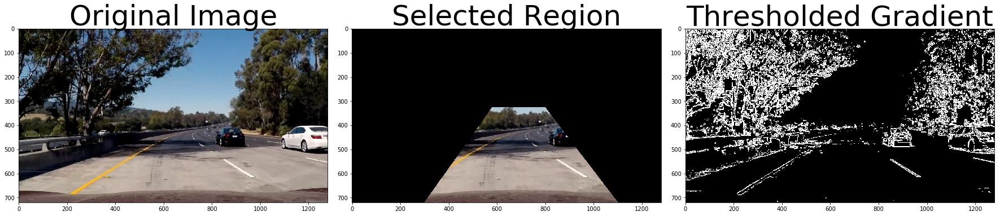

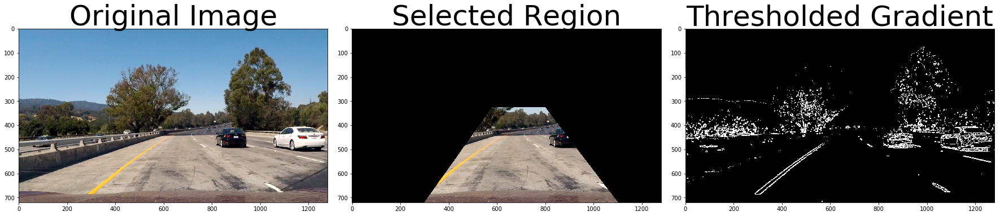

In [64]:
test_images = glob.glob("../test_images/*")

def abs_sobel_thresh(img, grad_thresh=(0,255), angle_thresh=(0, np.pi/2)):
    # Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    gray = hls[:,:,2];
    
    sobelx = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    sobely = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    
    #Each pixel of the resulting image contains a value for the angle of the gradient away 
    #from horizontal in units of radians, covering a range of −π/2 to π/2. 
    #An orientation of 0 implies a horizontal line and orientations of +/−π/2 imply vertical lines. 
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*gradmag/np.max(gradmag))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    mask = (scaled_sobel >= grad_thresh[0]) & (scaled_sobel <= grad_thresh[1]) 
            #& (absgraddir >= angle_thresh[0]) & (absgraddir <= angle_thresh[1])
    
    binary_output[mask] = 1
    #binary_output[(scaled_sobel >= grad_thresh[0]) & (scaled_sobel <= grad_thresh[1])] = 1
    #binary_output[(absgraddir >= angle_thresh[0]) & (absgraddir <= angle_thresh[1])] = 1
    
    # Return the result
    return binary_output
   
def select_region_of_interest(img,vertices):
    mask = np.zeros((img.shape[0],img.shape[1]))

    cv2.fillConvexPoly(mask,vertices,1)
    mask = mask.astype(np.bool)

    out = np.zeros_like(img)
    out[mask] = img[mask]
    
    return out

LEFT_BOTTOM = [300,image.shape[0]]
RIGHT_BOTTOM = [1100,image.shape[0]] 
TOP_LEFT = [580,325]
TOP_RIGHT = [800,325]

VERTICES = np.array([LEFT_BOTTOM,TOP_LEFT,TOP_RIGHT,RIGHT_BOTTOM],np.int32)

    
binary_images = []
for item in test_images:
    image = mimg.imread(item)
    fig = plt.figure(figsize=(12,8))
    
    # Run threshold
    grad_binary = abs_sobel_thresh(image, grad_thresh=(40,255), angle_thresh=(0.5, 1.5))
    binary_images.append(grad_binary);
    
    #Run region of interest
    trapazoid = select_region_of_interest(image, VERTICES)
    
    # Plot the result
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(trapazoid)
    ax2.set_title("Selected Region", fontsize=50)
    ax3.imshow(grad_binary, cmap='gray')
    ax3.set_title('Thresholded Gradient', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


## Explore color spaces

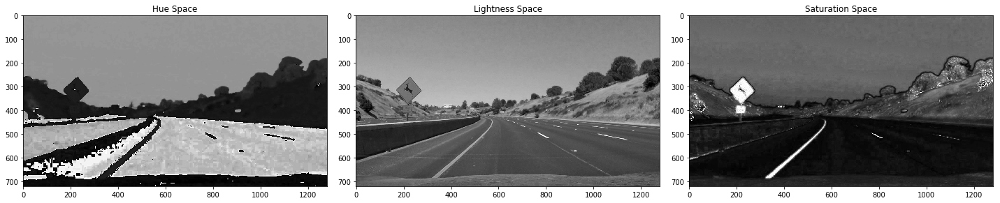

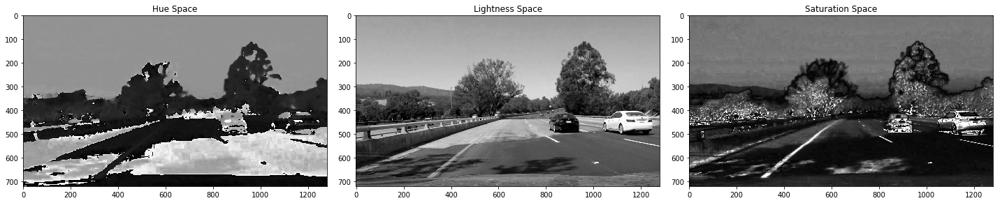

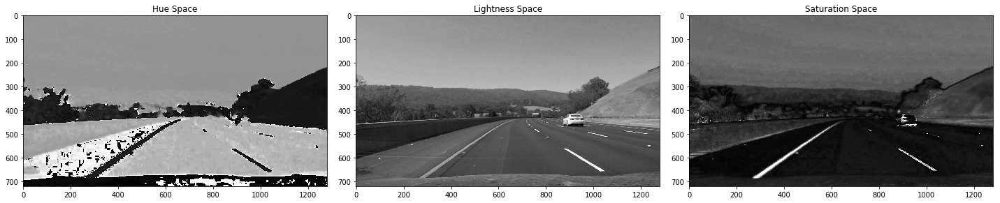

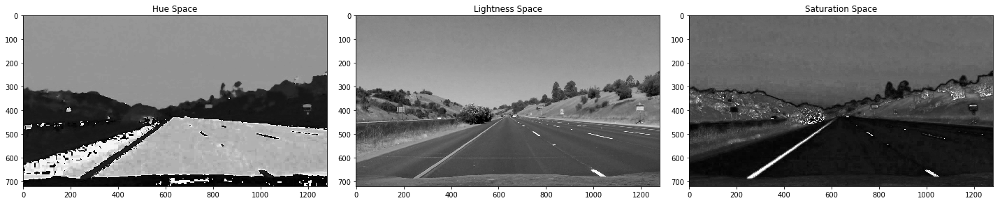

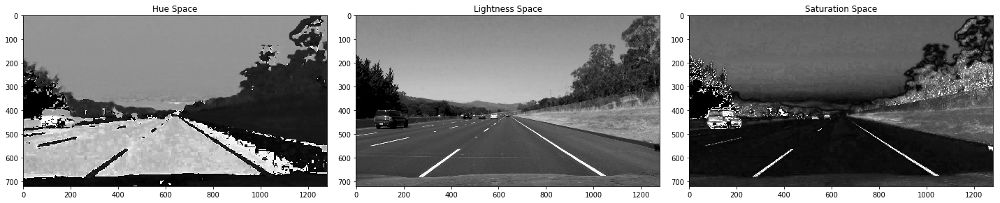

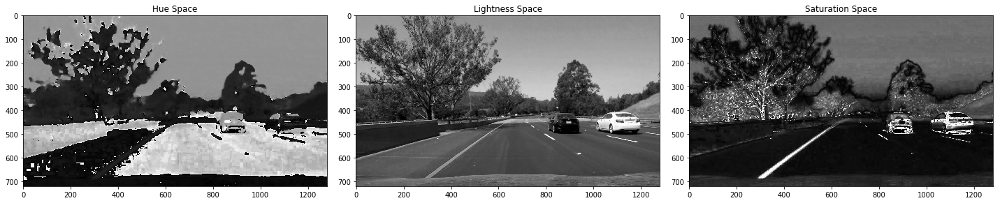

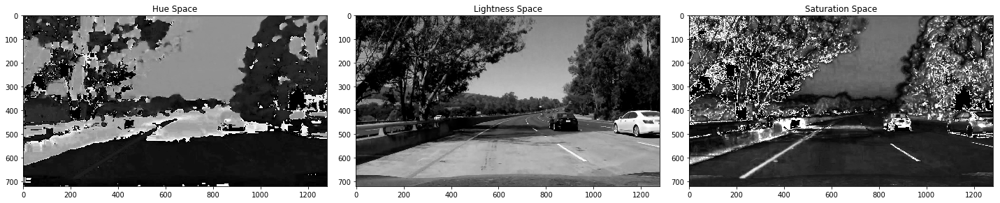

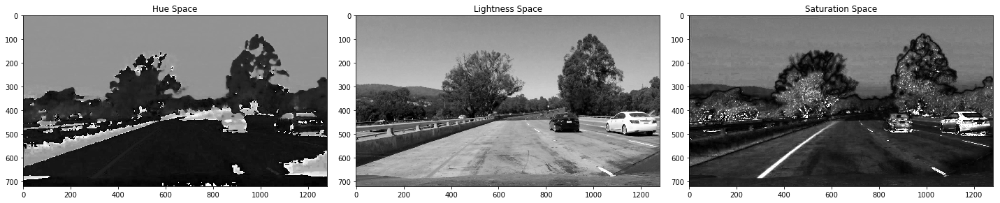

In [61]:
for idx,item in enumerate(test_images):
    image = mimg.imread(item)

    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    fig, axes = plt.subplots(ncols=3, figsize=(20,6))
    fig.tight_layout()
    ax = axes.ravel()
    ax[0].imshow(hls[:,:,0],cmap="gray")
    ax[0].set_title("Hue Space")
    ax[1].imshow(hls[:,:,1],cmap="gray")
    ax[1].set_title("Lightness Space")
    ax[2].imshow(hls[:,:,2],cmap="gray")
    ax[2].set_title("Saturation Space")
    if idx==7:
        fig.savefig("hls_color_space.jpg")
    

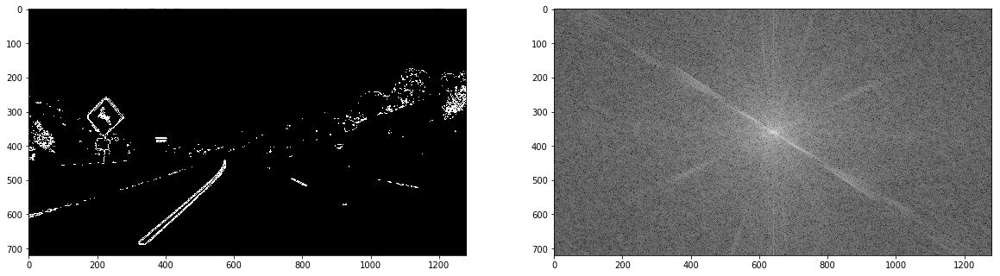

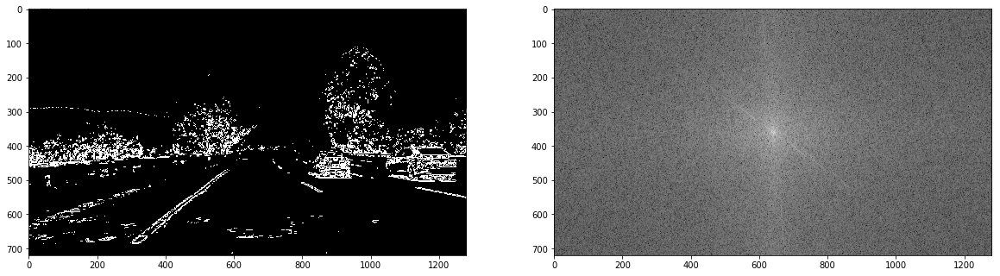

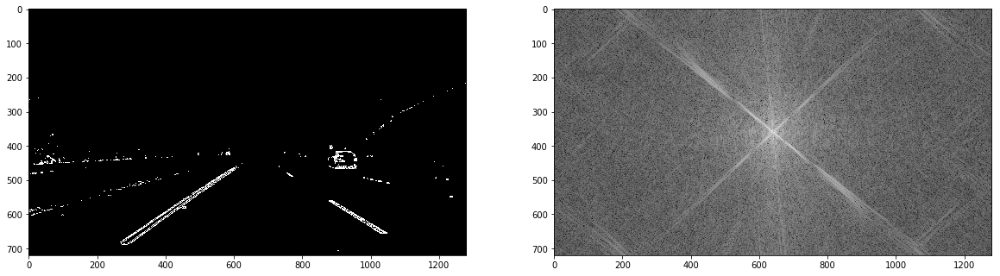

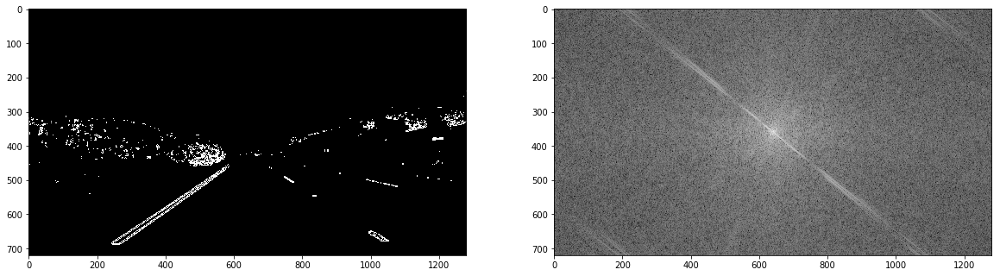

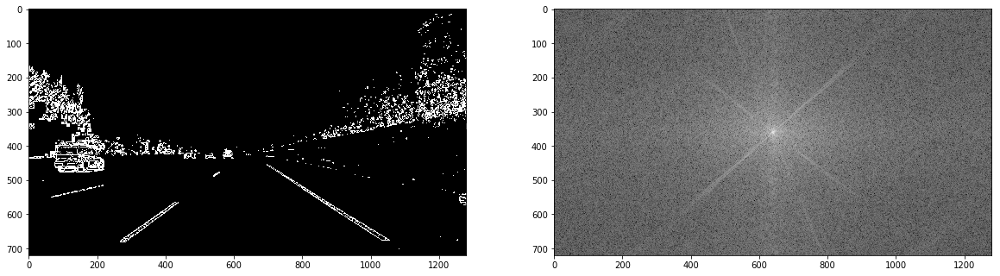

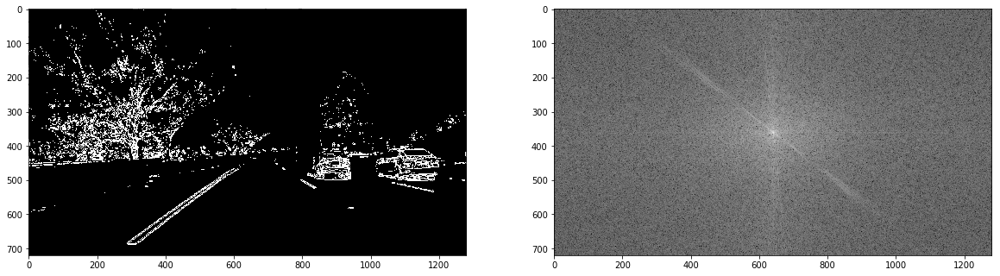

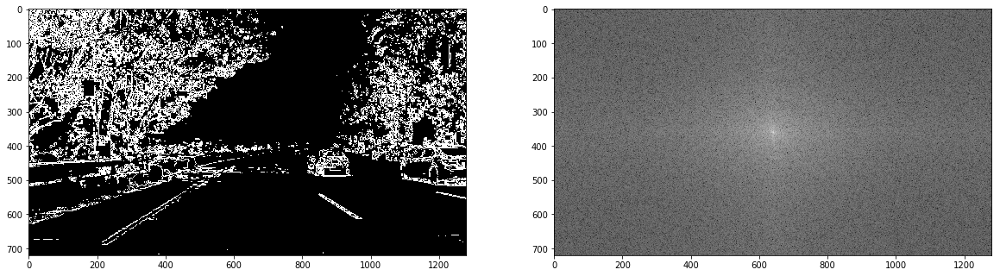

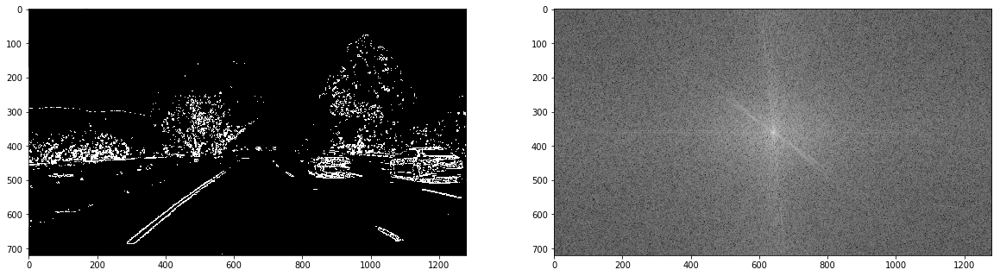

In [74]:
for item in binary_images:
    #image = mimg.imread(item)

    #hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    f_img = np.fft.fftshift(np.fft.fft2(item))

    mask = np.zeros_like(f_img,dtype=bool)
    
    fig, axes = plt.subplots(ncols=2, figsize=(20,9))
    ax = axes.ravel()
    ax[0].imshow(item,cmap="gray")
    ax[1].imshow(np.log(abs(f_img)+1),cmap="gray")